# **Введение**


Загрузим небольшой аудиофайл, скачать который можно здесь - https://freesound.org/people/jcveliz/sounds/92002/

In [0]:
from google.colab import files
files.upload()

Отказавшись на этом этапе от must have библиотеки **librosa** для работы с аудиосигналами, в пользу более низкоуровневой библиотеки **wave** для лучшего понимания процесса - напишем функцию для парсинга аудиофайлов.

In [0]:
import wave
import numpy as np
import matplotlib.pyplot as plt


def read_wave(filename):
    """Reads a wave file.
    filename: string
    returns: wave as numpy-array
    """
    file = wave.open(filename, mode="r")

    n_channels = file.getnchannels()
    n_frames = file.getnframes()
    sampwidth = file.getsampwidth()
    framerate = file.getframerate()

    file_as_str = file.readframes(n_frames)

    file.close()

    types = {1: np.int8, 2: np.int16, 4: np.int32}
    data = np.frombuffer(file_as_str, dtype=types[sampwidth])

    # if not mono, then make mono
    if n_channels == 2:
        data = data[::2]

    return data, framerate, sampwidth

Xn(длинна выборки описывающей сигнал): 220500
Продолжительность сигнала (секунды): 5.0
Частота дискретизации: 44100 Гц
Ширина бита/Битовая глубина: 16 бит - знаковое целое (-32768-32767)
Period: 2.2675736961451248e-05
time_step(очень маленько число): 9.1e-06 
Tn length: 220500





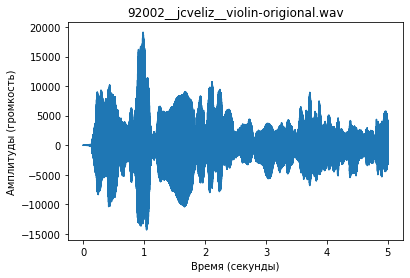

In [0]:
filename = "92002__jcveliz__violin-origional.wav"
samples, sampling_rate, sampwidth = read_wave(filename)


Xn = len(samples)
time = np.arange(Xn) / sampling_rate
duration = Xn/sampling_rate
period = 1 / sampling_rate
n_samples = sampling_rate*duration
Tn = samples / n_samples
time_step = np.around(Tn[150] - Tn[149], 7)

bit_types = {1: "8 бит -  целое число(0-255)", 
             2: "16 бит - знаковое целое (-32768-32767)", 
             4: "32 бит - знаковое длинное целое (-2147483648-2147483647)"}

print("Xn(длинна выборки описывающей сигнал):", Xn)
print("Продолжительность сигнала (секунды):", duration)
print("Частота дискретизации:", sampling_rate, "Гц")
print("Ширина бита/Битовая глубина:", bit_types[sampwidth])
print("Period:", period)
print("time_step(очень маленько число):",time_step,
      "\nTn length:", len(Tn))
print("\n\n")

plt.plot(time, samples);
plt.title(filename)
plt.xlabel("Время (секунды)");
plt.ylabel("Амплитуды (громкость)");

**Периодический сигнал** - Сигналы которые не мяняються во времени, их частотные компоненты на протежении всего времени неизменны.
Пример - синусоида с заданной частотой 3 Гц.

**Апериодический сигнал** (наш случай) - Сигналы которые на протежении времени, могут содержать различные частоты. 
Пример - практически все звуковые сигналы.

---

**Аналоговый  сигнал** - изменяется непрерывно во времени и может принимать любые значения от **-∞** до **+∞** на некотором интервале времени.



**Дискретный сигнал** - имеет начало и конец и описываеться конечным числом точек **Xn** взятых в моменты времени **Tn**, 

---

**period** - В случае периодического сигнала - означает время на совершения полного колебания, иначе говоря - время затраченое радиус-вектором круга на преодоления пути равным 2pi радиан, оно же время изменения фазы в растояние 2pi радиан.

---

**time_step** - **Период дискритизации** растояние между точками дискретного сигнала, оно же период дискретизации, оно же интервал выборок (точек) - называеться периодом дискритизации.

---

**sample_rate** - **Частота дискритизации** определяет каким количеством точек будет описан сигнал, теорема [**Виттакера-Найквиста-Котельникова-Шеннона**](https://ru.wikipedia.org/wiki/%D0%A2%D0%B5%D0%BE%D1%80%D0%B5%D0%BC%D0%B0_%D0%9A%D0%BE%D1%82%D0%B5%D0%BB%D1%8C%D0%BD%D0%B8%D0%BA%D0%BE%D0%B2%D0%B0), далее ВКНШ, для дискретизации непрерывного сигнала требутся как минимум **F*2** samples (точек) для правельной записи сигнала, где **F самая высокая частота  сигнала**, Однако аудиофалы семплируються одним из [общепринятых стандартов](https://manual.audacityteam.org/man/sample_rates.html?__cf_chl_captcha_tk__=440d8fa101b7330d2f7a88d12fa6559c74695b47-1586378058-0-AdqHQxJNSaE7q8EvI-Olb7k7_-jLoeZDmca7kM5CHskuHDaQTUmMc_oRV0nWqS_J7KHgftLBNss0dpF4zzQv59-luUC04SQyx4cLdeJ1Siww8_jkiSI_pBsIjVea_ysMu68S7SF1AZhSuvsCsXnydih_Vly_zD73ssKzUf-GsIjAwQT-kJaDwqIO1YJXIE74XIfK7XM1RUrDHVHnjJ_T5reDYm4BMa5wlqQwi6gKRZCPggGBz30RwDVGUBMHcG7do1Ds67EBCGTq8AlpV77F5sMEkdkHkllELXPxH_i06utkOpjLSBEJJusSs4zyjIi47v0AqDFNxhyuJgxNb7Yu8e1tM_F-IdksJcGLJfTBMD0YXFzpiq9SVuKzlGGAFODF7prbZOQzwoLA_fBfmAyNHN0I42twA6ibZFiryBN38HFSPu-CBcckl0KpfLsH2ud1qDP78uWGfXstCG25t7UpQY4Q25nr5PEQ81dYjJBtu32-nRgPRnOPCVqBZzTm_dtojWv8TO9pkxF-O9Tw9i-_B50d2f2ftkJSR5_M6X6XJ8G4IO1sa8dJsJ4p1PLIMedy8c4Msfc1SDugOGTHE2vL0GU).

Стандарты расчитывались с учетом психоакустики, стоимости хранения данны, и т.д. так как **человеческий слух слышит в интервале от 20 Гц до 20мГц** то **один из самых распространненых стандартов частоты дискретизации являеться 44100 гц**, 

Так как исходя из теоремы ВНКШ **F*2** в случае 44100/2 = 22050 что примерно соотвтествует порогу слышимости человека, благодаря чему из записанного сигнала не потеряеться ничего что смог бы услышать человек, иначе говоря важная информациия, не рискуя утонуть в деталях оставляю ссылки на доп источники:
+ 1.http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter1/01_04.php
+ 2.http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter1/01_03.php
+ 3.http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter2/02_03.php
+ 4.https://www.youtube.com/playlist?list=PLK2iJLHrtEkw8YVvWz6D7koDN0kfXBdSv

**sampwidth** - **Ширина бита/Битовая глубина** определяет каким **"разнообразием" чисел** возможно описать сигнал, так например если частота дискретизации сигнала с высокими частотами будет большой, а ширина битности маленькой, то хоть сигнал и будет описан большим количеством точек - из-за низкой ширины битности будут утеряны высокие чатсоты, и как следствие, из сигнала утечет много информации.
Вновь не рискуя утонуть в деталях оставляю ссылки на доп источники:
+ 1.http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter2/02_05.php
+ 2.https://ask.audio/articles/music-production-tutorial-back-to-basics-bit-depth-sample-rate-and-headroom/ru

Поскольку наш сигнал дискретезирован с частотой выборки в 44100 Гц - его описывает выборка состоящая из 44100 точек.
Если бы наш сигнал был периодичным - то по определению мы могли бы сказать что он является циклом который повторяется 44100 раз в секунду, и что за 1/44100 = период времени за который цикл завершает 1 повтор, или **совершает 1 колебание**.

---
Но так как наш сигнал являеться апериодическим, а значит содержит различные частоты и амплитуды, тогда в таком случае - период не содержит ценной информации, но мы все еще имеем возможность **иследовать сигнал на содержания мощности амплитуд и разнообразие частот в зависимости от времени -  c помощью Пробразования Фурье**, а точнее его оптимизированной версией Быстрого преобразования Фурье, и последуйщим созданием Спектограммы, но об этом позже.

---

# Периодические Cигналы | Periodic Signal

# Частота и Частота Дискретизации aka Frequency & Sample rate.

Иследуем график периодического сигнала в зависимости от его собственной частоты и частоты дискритизации.

---

Для этого напишим функцию которая принимает частоту и частоту дискретизации в качестве аргументов, и создает график синусоиды с задаными параметрами.


In [0]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import time

sns.set_style("darkgrid")

def make_signal(frequency, sample_rate):

    fig, ax = plt.subplots(figsize=(15, 10))

    # signal
    x = np.arange(sample_rate)
    y1 = np.sin(2*np.pi*frequency * (x/sample_rate))
    duration = np.linspace(0,1,sample_rate)

    # time_steps
    x_step1, x_step2 = duration[1:3]
    y_step1, y_step2 = -0.1, -0.1

    period = np.around(1/frequency, 2)
    time_step = np.around(x_step2 - x_step1, 7)

    # anotations
    x_annotation1 = (x_step1 + x_step2) / 2
    y_annotation1 = -0.35


    # plot signal
    ax.stem(duration, y1, "purple")
    ax.plot(duration, y1, c="y")
    ax.set_xlabel("Время (секунды) -->", fontsize=18)
    ax.set_ylabel("<-- Амплитуда -->", fontsize=18)
    ax.set_title(f"Сигнал с частотой {frequency} Гц\n и частотой дискритизации {sample_rate}", fontsize=18)


    # plot annotatation
    ax.annotate("",
                xy=(x_step1, y_step1), xycoords='data',
                xytext=(x_step2, y_step2), textcoords="data",
                arrowprops=dict(arrowstyle="<->", color="black",
                                lw=2.2,
                                shrinkA=5, shrinkB=5,
                                patchA=None, patchB=None,
                                connectionstyle="bar, fraction=-0.6"))


    ax.text(x_annotation1, y_annotation1, f"Период \n дискритизации = {time_step}", size=12,
            ha="center", va="center",
            bbox=dict(boxstyle="round",
                    ec="black",
                    fc="cyan",
                    )
            )

    ax.annotate(f'Период \nсигнала = {period}',
                (period, 0), xytext=(0.6, period), textcoords='data',
                bbox=dict(boxstyle="round",
                    ec="black",
                    fc="cyan",
                    ), 
                arrowprops=dict(arrowstyle = "->",
                                lw=2.2,
                                color="black",
                                connectionstyle = "angle,angleA=0,angleB=90,rad=10"))

    ax.legend(('Сигнал', 'Семплы'),
            loc='upper right')

    # save figure
    fn = str(int(time.time())) + ".png"
    plt.savefig(fn, bbox_inches='tight', pad_inches=0.2)
    plt.close()



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Создадим **GIF** на основе сгенерированных синусоид, чтобы продемонстрировать как изменяеться форма сигнала с ростом частоты дискретизации.

In [0]:
%%time

# Генерируем графики.

# Frequency and Sample rate
f = 5
sr = [12, 13, 14,15, 16, 17,18,19, 20, 21,
      22,23,24,25,26,27,28,29,30,32,
      34,36,38,40, 45,50,55, 60, 65,70, 
      75,80,85,90, 95,100,110, 120,130,140,
      150,160, 170, 180,190, 200, 250, 300, 350, 400,
      500, 600, 700, 800, 900,1000, 2000, 3000, 5000, 10000]

for i in sr:
    make_signal(sample_rate=i, frequency=f)
    print(i)
    time.sleep(0.5)
print("Done!")

In [0]:
from PIL import Image
import glob

# Сохраняем сгенерированые графики в качестве Gif.

fp_in = "*.png"
fp_out = "image.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=300, loop=0)

In [0]:
# save as video

"""
import cv2
import os

image_folder = 'images'
video_name = 'video.avi'

framerate = 6
images = sorted(glob.glob("*.png"))#msgs#[img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, framerate, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image)))

cv2.destroyAllWindows()
video.release()
"""

'\nimport cv2\nimport os\n\nimage_folder = \'images\'\nvideo_name = \'video.avi\'\n\nframerate = 6\nimages = sorted(glob.glob("*.png"))#msgs#[img for img in os.listdir(image_folder) if img.endswith(".png")]\nframe = cv2.imread(os.path.join(images[0]))\nheight, width, layers = frame.shape\n\nvideo = cv2.VideoWriter(video_name, 0, framerate, (width,height))\n\nfor image in images:\n    video.write(cv2.imread(os.path.join(image)))\n\ncv2.destroyAllWindows()\nvideo.release()\n'

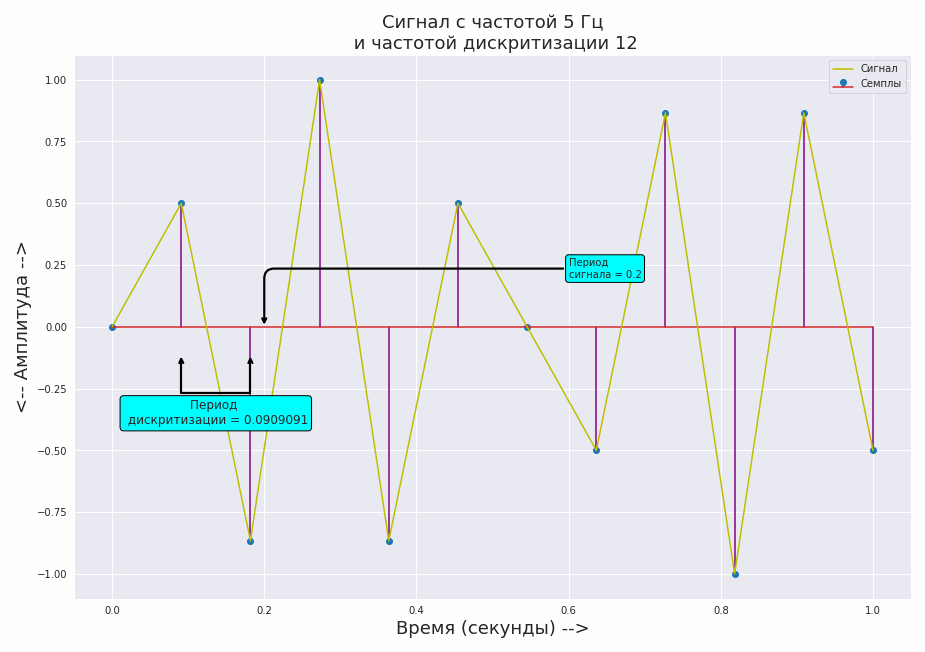

In [0]:
# Display our gif
from IPython.display import Image as Image_display

with open('image.gif','rb') as f:
    display(Image_display(data=f.read(), format='png'))

Чем больше семплов приходиться на 1 период сигнала, тем больше график похож на сгенерированный сигнал  который мы задали как периодическую синусоиду с амплитудой 1 и частотой 5 Гц.


## Сгенерируем еще 1 сигнал, продолжительностью в 1 секунду, и попытаемся его прослушать.

In [0]:
# Напишем функции создания и отображения сигнала.

from IPython.display import Audio

# Генерация сигнала
def periodic_signal(sample_rate, frequency, amplitude=1, duration=1):
    PI2 = np.pi * 2 
    n_samples = int(sample_rate * duration) # количество семплов
    samples = np.arange(n_samples) # массив семплов для генерации сигнала.
    periods = samples / n_samples # масив временных периодов для генерации сигнала.
    signal = np.sin(PI2*frequency*periods) * amplitude # массив семплов для описания сигнала.
    time = np.linspace(0, duration, n_samples) # время поделенное на равные промежутки времмени чтоб соответствовать продолжительности сигнала.
    return time, signal

# График сигнала
def plot_signal(time, signal, sample_rate):
    plt.figure(figsize=(15, 10))
    plt.plot(time, signal);
    plt.stem(time, signal,
            "purple",label="samples");
    plt.title(f"Сигнал с частотой дискритизацией {sample_rate} Гц", fontsize=20)
    plt.ylabel("Амплитуда", fontsize=18)
    plt.xlabel("Секунды", fontsize=18)
    plt.legend(fontsize=18)
    return plt.show()

### Cигнал с собственной частотой 220 Гц и Частотой дискретизации 440

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


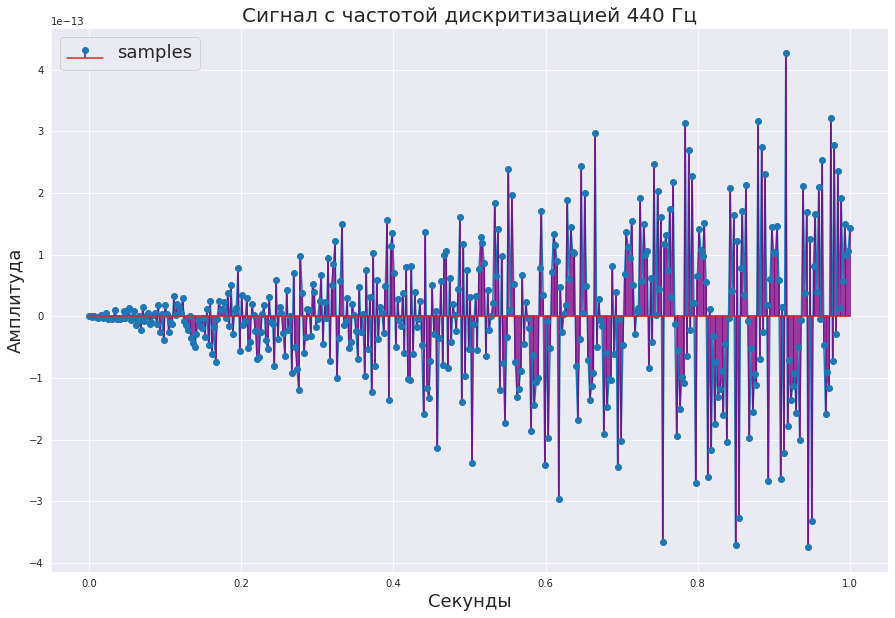

In [0]:
# Определим частоту сигнала и частоту дискритизации.
frequency = 220 # по теореме ВНКШ samples_rate / 2  = самая высокая возможная частота.
sample_rate = frequency * 2 # по теореме ВНКШ необходимый минимум кол-во семплов для описания сигнала.
time, signal = periodic_signal(sample_rate, frequency, amplitude=2)

# Изобразим получившийся сигнал
plot_signal(time, signal, sample_rate)

Audio(data=signal, rate=sample_rate)

Герцы эта еденица измерения количество повторов волны за 1 секунду, казалось бы что сигнал должен повторяться 220 раз за 1 секунду времени, и иметь амплитуду размера 1, но из-за низкой частоты дискритизации сигнал явно не похож на синусоиду с задаными параметрами, так как при семплировании заданого сигнала с чатсотой дискритизации **по теореме ВНКШ** мы потеряли много информации, 
далее мы увидис что чем больше частота дискритизации - тем точнее будет сигнал.


---
Из-за [порога слышимости человека](https://ru.wikipedia.org/wiki/%D0%A1%D0%BB%D1%83%D1%85) - такой сигнал нам не услышать, но если бы мы захотели бы его дискретизировать, то его бы продолжительность считалась как n_samples / sample_rate.

Подробней о психоакустике :
+ https://lifehacker.ru/kak-protestirovat-svoj-sluh-2/

+ https://www.youtube.com/watch?v=uuLjsvMrCOM

+ https://www.youtube.com/playlist?list=PLK2iJLHrtEkw8YVvWz6D7koDN0kfXBdSv

---

На практике мы почти всегда имеем дело с апериодическими сигналами, и зачастую семплируем сигналы с одним из [общепринятых стандартов](https://manual.audacityteam.org/man/sample_rates.html?__cf_chl_captcha_tk__=70caa5006d358b7f4b85f1b91657e0e9a6613659-1586371951-0-AVjQ-2JzdpLm5iu_Qc6gnPywSY-mRgXeo5WutkyhIgQ14Yw2ETrKyOybxlrpCIRaFxd29ndBh96lsrZjZm1_ilXbG023hlSvuY0RCxOBJN9crBmQaxgF6-w3BWym4fKA-ZDn2sqSWG6cuGyzcWGiSDCRWMAuhM23iPX0v7cR90jHsxYd4c1-C5euyhUxHiCUODH_5i3AWVDT7TX9IjI7RZtAJjH5jtbN5XowoaNK7BeMmaJMWGv8DemH9Bqope9TcqS0RYoPsfHDwZ11oa1Cgeiq8YzqQbRQPZGwJFQ1Ar7qIK8QGSXIG2ZF5CI07eKI4rNk3K5QlKDc1bjpF9y7Kx8qxolhwUaq65nWgfSMmNg4jr0Tvtx5s_se8cRsSLuJKpgJDONcVZa1zBq_1wV1qOjxqXd_g_Ezx2NKwD8ykh2c6_4TXjR8sUuaJw2Y7UjpdayDEPZkZctft5f3bZtbuLCerb4dYIVlCy9GVT6bOWtLZFJe9naEgd9wEjWfiEO7hTzwbaao8lhImH19rqfsXXIrnN8Lb2Ib6OqqI5ZTf4pwaSsQOjoZApwE-CmpwL12pClPmLUs5qLinSXJYKf2OCg) эти стандарты были подобраны 
основывась на том как слышит человек и позволяют сохранить максимум информации из сигнала,так например если мы семплируем вышеприведенный сигнал с sample_rate не frequency * 2 а с **11025** (одним из стандартов) то сигнал уже будет иметь другой вид, и мы даже сможем его услышать:

### Cигнал с собственной частотой 220 Гц и Частотой дискретизации 11025

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


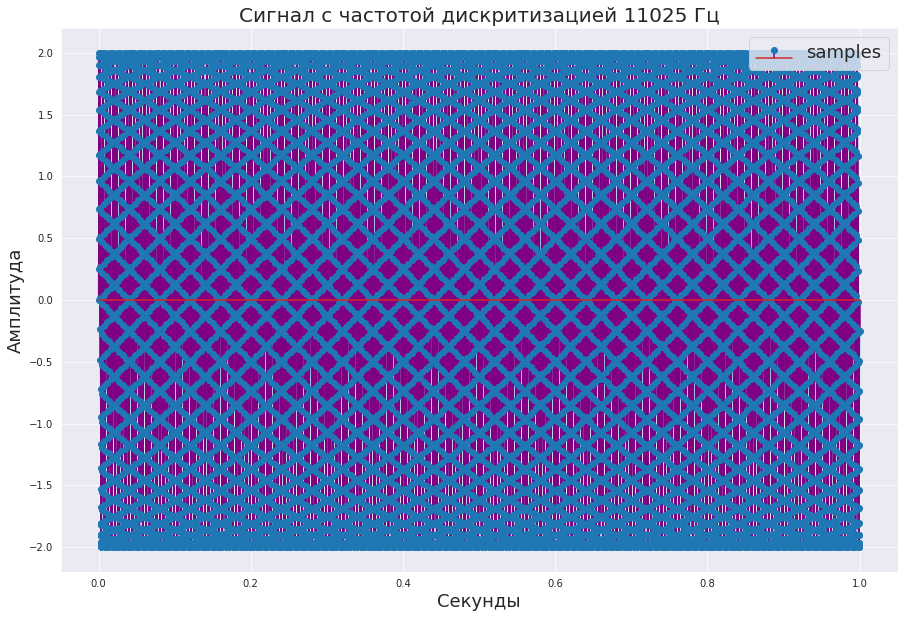

In [0]:
# Определим частоту сигнала и частоту дискритизации.
frequency = 220 # по теореме ВНКШ samples_rate / 2  = самая высокая возможная частота.
sample_rate = 11025 # один из стандартов 
time, signal = periodic_signal(sample_rate, frequency, amplitude=2)

# Изобразим получившийся сигнал
plot_signal(time, signal, sample_rate) 
Audio(data=signal, rate=sample_rate)

Ничего не разобрать, изобразим **небольшой срез** этого же сигнала

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


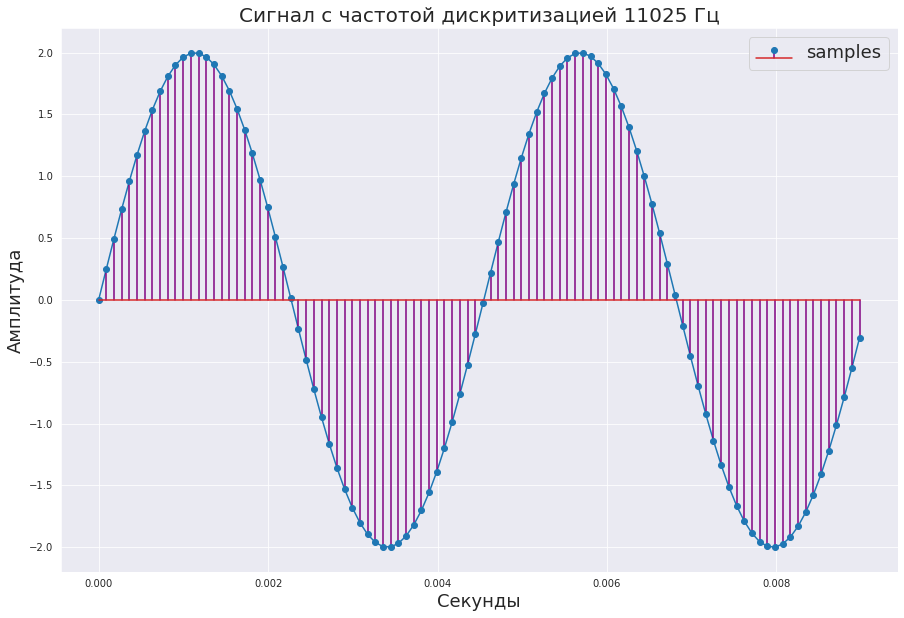

In [0]:
# Возьмем небольшой срез сигнала чтоб можно было разглядеть семплы:
time_slice = time[:100]
signal_slice = signal[:100]

# Изобразим получившийся сигнал
plot_signal(time_slice, signal_slice, sample_rate) 
Audio(data=signal, rate=sample_rate)

Это гораздо больше похоже на синусоиду которую мы задали, чем предыдущий график.


Из этого следует что хоть исходя из теоремы ВНКШ для описания сигнала с периодом **T** необходимый минимум периода дискритизации = **T/2** - и соответственно **N** количество выборок (семплов) = **2 * самую высокую частоту сигнала**, для сигнала с различной периодичностью и амплитудам - используют стандарты дискритизации расмотренные выше, что позволяют семплировать сигнал горазда чаще, тем самым сохраняя большье информации.

---
Апериодические сигналы с выскокими частотами и периодом дискритизации сливаються в форму похожую на волну, имеенно поэтому сигналы часто называют **waveform**.

---
Ниже представлен интерактивный апплет для демонстрации того как меняеться форма волны в зависимости от ее Частоты и частоты дискретизации.

### Интерактивный Апплет

In [0]:
# График сигнала
def interact_signal(sample_rate, frequency):

    PI2 = np.pi * 2 
    samples = np.arange(sample_rate) # массив семплов для генерации сигнала.
    periods = samples / sample_rate # массив временных периодов для генерации сигнала.
    signal = np.sin(PI2*frequency*periods) # массив семплов для описания сигнала.
    time = np.linspace(0, 1, sample_rate)
    plt.figure(figsize=(15, 10))
    plt.plot(time, signal);
    plt.stem(time, signal,
            "purple",label="samples");
    plt.title(f"Сигнал с частотой дискретизацией {sample_rate} Гц", fontsize=20)
    plt.ylabel("Амплитуды", fontsize=18)
    plt.xlabel("Секунды", fontsize=18)#Условные единицы времени
    plt.legend(fontsize=18)
    return Audio(data=signal, rate=sample_rate)

In [0]:
from ipywidgets import interact, fixed
from IPython.display import display

interact(interact_signal, sample_rate=(0, 44100), frequency=(0, 20000), amplitude=1);

interactive(children=(IntSlider(value=22050, description='sample_rate', max=44100), IntSlider(value=10000, des…

# Апериодические Сигналы | Aperiodic Signal

Воспользуемся ранее написаной функцией и сгенерируем несколько синусоид с разной частотой колебаний

In [0]:
# Определим частоту сигнала и частоту дискритизации.
frequency1 = 3
frequency2 = 6
frequency3 = 8
sample_rate = 100 # по теореме ВНКШ необходимый минимум кол-во семплов для описания сигнала.

time, signal1 = periodic_signal(sample_rate, frequency1, amplitude=3)
time, signal2 = periodic_signal(sample_rate, frequency2, amplitude=2)
time, signal3 = periodic_signal(sample_rate, frequency3, amplitude=1)

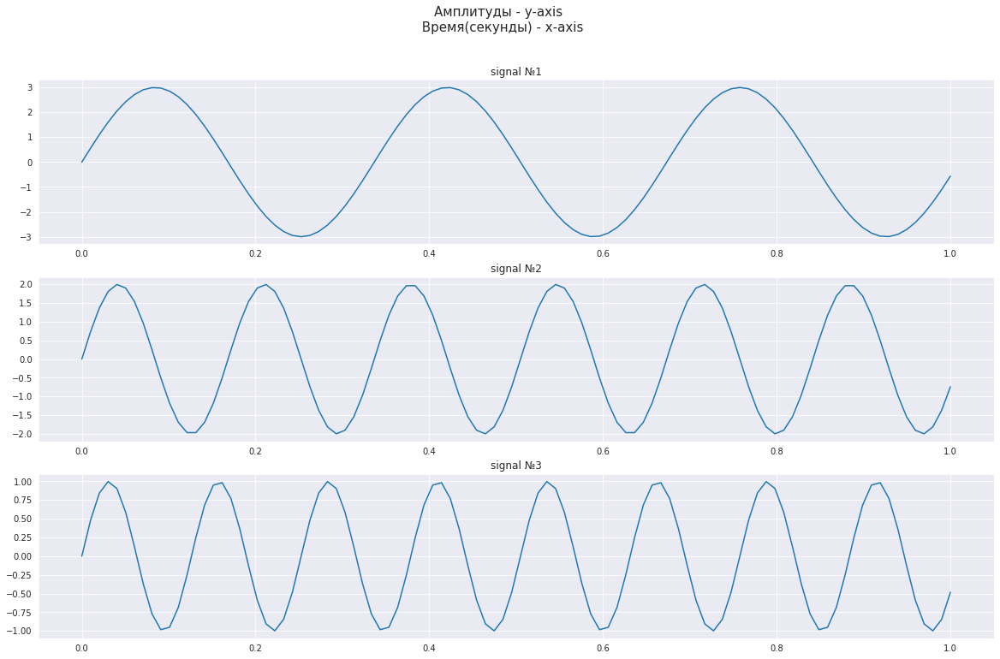

In [0]:
# Изобразим получившийся сигнал

import matplotlib.pyplot as plt
import numpy as np

fig,a =  plt.subplots(3,1, figsize=(20, 12))
fig.suptitle('Амплитуды - y-axis \n Время(секунды) - x-axis', 
             fontsize=15)
a[0].plot(time,signal1)
a[0].set_title('signal №1')

a[1].plot(time, signal2)
a[1].set_title('signal №2')

a[2].plot(time, signal3)
a[2].set_title('signal №3')

plt.show()

Обычно **апериодический сигнал состоит из огромного количества таких синусоид** сума которых образует сложную форму.

Сумируем эти синусоиды, создав тем самым новый сигнал **aperiodic_signal**, и посмотрим на его график.

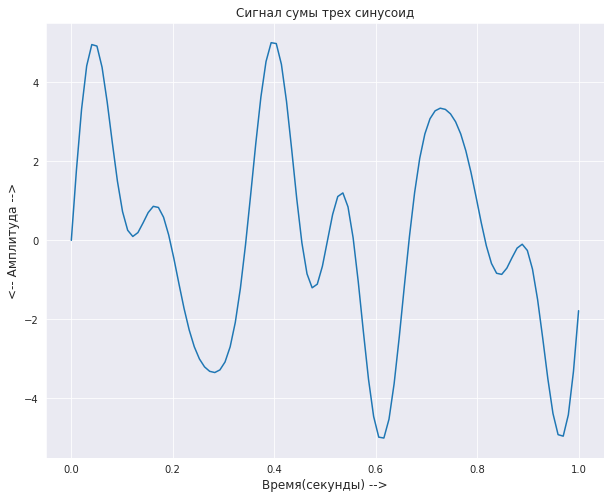

In [0]:
# Сигнал явяеться сумммой трех периодических синусоид
aperiodic_signal = signal1 + signal2 + signal3

plt.figure(figsize=(10, 8))
plt.plot(time, aperiodic_signal)
plt.title("Сигнал сумы трех синусоид")
plt.xlabel("Время(секунды) -->", fontsize=12);
plt.ylabel("<-- Амплитуда -->", fontsize=12);
plt.show()

Как можно видеть данный сигнал уже имеет сложнее форму чем синусоида.

Глядя на график во времени, аналитически понять что присутствующие в нем частоты это **frequency1**, **frequency2**, и **frequency3**  - не возможно.

Но с помощью **Преобразования Фурье** - мы сможем  **разложить сигнал на составляющие его частоты**, более того, воспользувайшись преобразованием Фурье мы получим так же информацию о "мощносте"/величине каждой из частот присутствующей в сигнале.

Для начала получим частоты нашего сигнала **aperiodic_signal**

# Преобразование Фурье | Fourier transform

В случае дискретного сигнала - формула анализа Фурье имеет следуйщий вид:

 ![image.png](https://wikimedia.org/api/rest_v1/media/math/render/svg/a67a42d99f8b2fce89cfd3b94b4aaf977d423fba)

Или почти таже формула с интерпретируящими подсказками:

![alt](https://betterexplained.com/wp-content/uploads/images/DerivedDFT.png)


Напишем функцию по этой форумуле, которая на вход будет принимать сигнал, а возращять присутствующие частоты и их мощность.

In [0]:
import numpy as np

def dft(x):
    """Compute the discrete Fourier Transform of the 1D array x"""

    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    M = np.exp(-2j * np.pi * k * n / N)
    return np.dot(M, x)

period =  1/sampling_rate

+ **x** - анализируемый сигнал
+ **N** - количество отсчетов (семпплов) она же продолжительность сигнала
+ **n** - временная выборка сигнала **x**
+ **k** - вектор индексов всевозможных частот **k**, (от 0 герц до **N-1** герц)
+ **M** - задает тректорию кругового оборота по часовой стрелке сигнала, учитывая расматриваемую частоту **k** и **процент времени n/N**.  Все вместе можно интерпретировать - как далеко мы продвинулись, за эту скорость и время. Матрица **M** содержит **траектории** для каждой ki частоты из вектора k. 

+ **return** вектор длинной **N** который содержит суммы посчитаных значений для кажой ki частоты. 

Напоминание как работает Матрично-векторное умножение:

![alt](https://image.slidesharecdn.com/tbb-100604140449-phpapp01/95/tbb-24-728.jpg?cb=1275660387/)

Алгоритм возвращает список комплексных чисел. Первая половина э списка возвращает термины с положительной частотой, а другая половина возвращает термины с отрицательной частотой, которые похожи на положительные. 
Поэтому мы расчитываем абсолютные значения половины от выхода алгоритма.
Так же делим на число элементов, чтобы амплитуды были в фактических значений, а не в суммах Фурье, а затем умножаем на 2 чтоб непотерять фактическую инфу об амплитуде из-за деления списка.

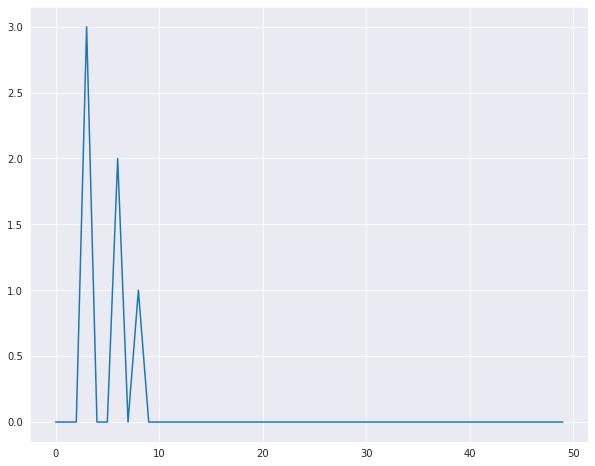

In [0]:
N = len(aperiodic_signal)
result = (np.abs(dft(aperiodic_signal))[:N//2] / N) *2

plt.figure(figsize=(10,8))
plt.plot(result);

Отлично! С помощью преобразование Фурье мы узнали что в нашем сигнале присутствуют 3 частоты: и что их амплитуды:3 Гц, 6 Гц, 8 Гц, и что их амплитудыи имеет размер: 3,  2,  1 что соответствуют частотам и амплитуда синусоид из которых получился анализируемый сигнал. 

На практике при расчете дискретных сигналов используют [Быстрое Преобразование Фурье](https://ru.wikipedia.org/wiki/%D0%91%D1%8B%D1%81%D1%82%D1%80%D0%BE%D0%B5_%D0%BF%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5_%D0%A4%D1%83%D1%80%D1%8C%D0%B5), смысл у него тот же, но алгоритм оптимизирован для эффективного вычисления.
Подробно расматривать его не станем, скажем только что фраза **"Разделяй и властвуй"** и следуйщий график - будет интуитивно понятной интерпретацией:

![alt](https://upload.wikimedia.org/wikipedia/commons/thumb/c/cb/DIT-FFT-butterfly.png/220px-DIT-FFT-butterfly.png)

Воспользуемся готовой реализацией модуля **fft**  из библиотеки **numpy**.

Перепишем функцию которая будет расчитывает fft для сигнала и рисовать график результата.

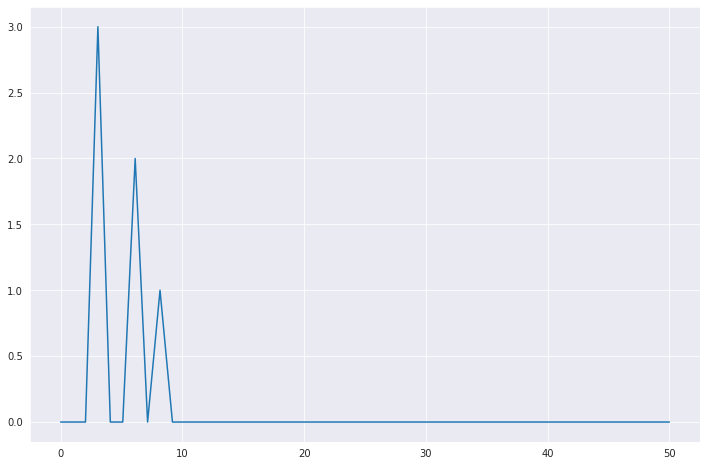

In [0]:
def fft_plot(signal, sampling_rate):
    n = len(signal)
    period = 1/sampling_rate
    yf = np.fft.fft(signal)
    xf = np.linspace(0.0,  1.0/(2.0* 1./sampling_rate), n//2)
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.plot(xf,  np.abs(yf[:n//2])/n*2)
    plt.show()

fft_plot(aperiodic_signal, 100)

### Быстрое Преобразование Фурье на наш аудиосигнал.

Воспользуемся библиотекой librosa и загрузим иследуемый аудиосигнал в массив чисел.

In [0]:
!pip install librosa

Duration (seconds): 5.0 
Sampling rate: 44100


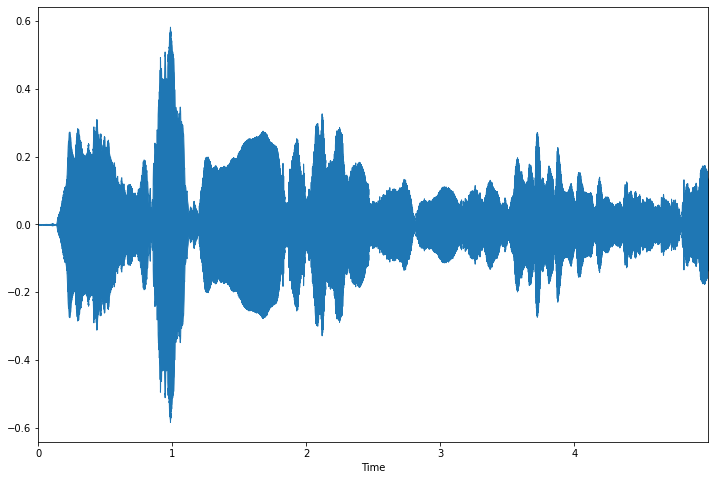

In [0]:
from IPython.display import Audio
import librosa
from librosa import display



samples, sample_rate = librosa.load(filename, mono=True, sr=None)
print("Duration (seconds):", 
      len(samples) / sampling_rate,
      "\nSampling rate:", 
      sampling_rate)

plt.figure(figsize=(12, 8))
librosa.display.waveplot(y=samples, sr=sample_rate)

Audio(filename)

Эта визуализация называется **представлением  сигнала во временной области**.
Этот график показывает амплитуду звуковой волны, она же громкость которая меняеться во времени, амплитуда которая равна нулю, из [физического определения](https://ru.wikipedia.org/wiki/%D0%97%D0%B2%D1%83%D0%BA) [звуковых волн](http://fizmat.by/kursy/kolebanija_volny/zvuk) - являеться  равновесием частиц воздуха, изменения давления вокрух которых приводят их в колебания  с некоторой частотой.


Из данного графика кроме как о громкости нечего не узнать, по этому передадим аудиосигнал в  нашу функуию **fft_plot**

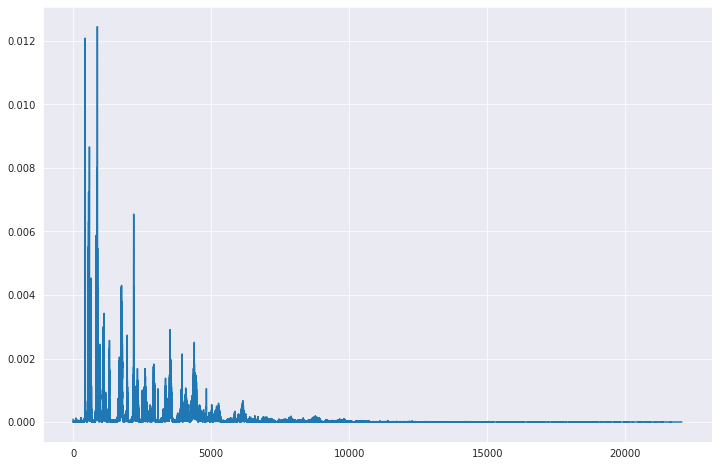

In [0]:
fft_plot(samples, sampling_rate)

Эта визуализация называеться **представлением сигнала в частотной области**, или **Спектром**. Расматриваемый сигнал длиной 5 секунд состоит из тысяч различных частот. Значения  частоты > 5000Гц-7000Гц очень малы, скорей всего большинство этих частот являються шумом. Мы строим графики частот в диапазоне от 0 до 22050 Гц, потому что наш сигнал был дискретизирован с частотой дискретизации 44100 семплов, и согласно теореме **ВНКШ** - масимальную частоту которую он может содержать будет **22050 Гц** (44100/2).

Так как мы анализируемый сигнал записанный в реальном виде то вместо np.fft.fft мы можем использовать функциию [np.fft.rfft](https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.rfft.html#numpy.fft.rfft) которая работает эффективнее.

Дополнительные источники информации на тему - **Преобразование Фурье** :
+ 1.https://www.youtube.com/watch?v=spUNpyF58BY
+ 2.https://www.youtube.com/watch?v=qS4H6PEcCCA
+ 3.http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter3/03_04.php
+ 4.https://betterexplained.com/articles/an-interactive-guide-to-the-fourier-transform/
+ 5.https://web.archive.org/web/20120418231513/http://www.altdevblogaday.com/2011/05/17/understanding-the-fourier-transform/
+ 6.https://habr.com/ru/company/otus/blog/449996/
+ 7.https://e-maxx.ru/algo/fft_multiply
+ 8.http://ru.dsplib.org/content/fourier_series/fourier_series.html
+ 9.http://old.pynsk.ru/posts/2015/Nov/09/matematika-v-python-preobrazovanie-fure/
+ 10.http://www.bizkit.ru/2020/01/21/16486/
+ 11.https://www.youtube.com/watch?v=mzHXQCWXc4s&list=PLxGo9dxQkqWB7xCLfpO3ec6sOUkaVIWyn&index=2

# Спектрограмма | Spectrogram

Теперь мы можем анализировать сигнал на разнообразие содержащих в нем частот и их велечин, но что на счет времени, как узнать какая или какие частоты гармонируют в конкретный момент времени?
Для того чтобы знать не только о присутсвие в сигнале той или иной частоты, а и знать когда она в нем присутствует существуют [**Спектограммы.**](https://en.wikipedia.org/wiki/Spectrogram)

**Смысл спектограммы** в том что бы сегментировать**(разделить на равные промежутки времени) анализируемый сигнал и для каждого сделать спектр, последовательно сложив спектры - получим график представления частот в зависимости от времени расматриваемого сигнала, или иначе Спектограмму.**

Спектограму так же называют **Кратковременным Преобразование Фурье | Short-time Furie Transform**

Раздробленый сигнал на части называют **окнами** сделав преобразование фурье для которых получим спектограммы, размер окна может варироваться от решаемой задачи, размер нашего окна будет составлять **20 мс** это значит что **размер окна будет 44100 * 20 * 0.001 = 882 частотных компонент, в диапазоне от 0 до 22050 Гц**, кроме того чтобы не терять информацию при разрывании сигнала(взятии окон) - рекомендуют перекрывають окна, т.е что бы каждое следуйщее окно содержало часть информациии предыдущего.


Перекрытие может варироваться от 25% до 75%, для каждого следуйщего окна мы будет перекрывать 50% от предыдущего, а значит длина шага или период будет 882 / 2 = 441 индекса,


In [0]:
window_ms = 20
stride_ms = 10

In [0]:
stride_size = int(0.001 * sample_rate * stride_ms)
window_size = int(0.001 * sample_rate * window_ms)

print("Окно:", window_size, 
      "\nШаг:", stride_size,
      "\nРазмерность масива семплов:", samples.shape)


Окно: 882 
Шаг: 441 
Размерность масива семплов: (220500,)


Необходимо усечь сигнал так чтобы его длине соответсвовало целое число количичества окон

In [0]:
# Extract strided windows
truncate_size = (len(samples) - window_size) % stride_size
samples = samples[:len(samples) - truncate_size]

print("Необходимо усечь:", truncate_size, 
      "\nРазмерность масива семплов:", samples.shape)

Необходимо усечь: 0 
Размерность масива семплов: (220500,)


Поскольку наше **окно составляет 882 семпла**, то всего окон будет len(samples)/882=250 масивов семплов, но так как мы обусловились перекрывать каждое окно на 50%, то масивов с окнами будет 500, каждый из которых будет содержать 50% значений предыдущего окна.

Чтобы не копировать одни и те же данные, воспользуемся функцией **np.lib.stride_tricks.as_strided**, которая работает похожим образом на **np.reshape**, она возвращает представление массива с указанной формой и смещением байтов между элементами для перехода по ним вдоль разных осей.
https://pyprog.pro/indexing_routines/lib_stride_tricks_as_strided.html

Таким образом **имеем масив размера 500 окон**, где **каждое окно содержит 882 значений**, первая половина которых ссылаеться на вторую половину прдыдущего окна.

In [0]:
nshape = (window_size, (len(samples) - window_size) // stride_size + 1)
nstrides = (samples.strides[0], samples.strides[0] * stride_size)
    
windows = np.lib.stride_tricks.as_strided(samples, 
                                        shape = nshape, strides = nstrides)

print("Размерность масива c окнами:", nshape, 
      "\nШаг для смещения между в байтах:", nstrides)

Размерность масива c окнами: (882, 499) 
Шаг для смещения между в байтах: (4, 1764)


### Подробней о смещениях

метод numpy массива **strides** возращает количество байт необходимых для перехода между элементами оси массива, по скольку масив **samples** одномерный и разреженный, то **чтобы перейти к каждому следуйщему числу - необходимо пройти 4 байта**, как раз столько сколько выделяеться памяти для хранения числа с типом данных np.float32

В качестве примера продемонстрируем пример для лучшего понимания:

In [0]:
print("Пример № 1")
x = np.arange(10).reshape(5, 2).astype(np.float32())
print(x)
print("Размерность x:", x.shape,
      "\nШаг в байтах по первой оси:", x.strides[0],
      "\nШаг в байтах по второй оси:", x.strides[1])

Пример № 1
[[0. 1.]
 [2. 3.]
 [4. 5.]
 [6. 7.]
 [8. 9.]]
Размерность x: (5, 2) 
Шаг в байтах по первой оси: 8 
Шаг в байтах по второй оси: 4


Потому что для того чтобы перейти от одного элемента к следуйщему, по первой оси**(5 элементов по 2 числа), необходимо пройтись по всем элементам которые содержит элемент, а это = 2числа*4байт = 8 байт**, а в случае второй оси(1 элемент - 2 числа) то для перехода от одного элемента к следуйщему необходимо 1 число* 4байта = 4 байт.

In [0]:
print("Пример № 2")
x = np.arange(100).reshape(2, 5, 10).astype(np.float32())
print(x)
print("Размерность x:", x.shape,
      "\nШаг в байтах по первой оси:", x.strides[0],
      "\nШаг в байтах по второй оси:", x.strides[1],
      "\nШаг в байтах по третей оси:", x.strides[2])

Пример № 2
[[[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
  [10. 11. 12. 13. 14. 15. 16. 17. 18. 19.]
  [20. 21. 22. 23. 24. 25. 26. 27. 28. 29.]
  [30. 31. 32. 33. 34. 35. 36. 37. 38. 39.]
  [40. 41. 42. 43. 44. 45. 46. 47. 48. 49.]]

 [[50. 51. 52. 53. 54. 55. 56. 57. 58. 59.]
  [60. 61. 62. 63. 64. 65. 66. 67. 68. 69.]
  [70. 71. 72. 73. 74. 75. 76. 77. 78. 79.]
  [80. 81. 82. 83. 84. 85. 86. 87. 88. 89.]
  [90. 91. 92. 93. 94. 95. 96. 97. 98. 99.]]]
Размерность x: (2, 5, 10) 
Шаг в байтах по первой оси: 200 
Шаг в байтах по второй оси: 40 
Шаг в байтах по третей оси: 4


## Утечка и оконные функции | Окно  Хемминга

Кроме **перекрытий** которые **предвотрощают потерю информации**, есть еще 1 предпроцессинг - **оконные функции**. Преобразование Фурье предполагает что сигнал периодический, это значит что при анализе фурье сигнал неявно соеденяеться в петлю. По скольку **сигнал разрываеться на окна без учета фазы**, то один конец сигнала(окна) скорей всего не совподает с другим концом, что влечет за собой **ложные частоты**, умножив каждый сегмент на некоторую  функцию мы сгладим окно так что на обоих концах - сигнал будет иметь одинаковые значения. То есть оконные функии нужны для того чтобы преобразовывать апериодические сигналы в нечто похожее на периодическое.

[**Окно  Хемминга**](https://studfile.net/preview/925203/page:3/) - самая распротраненная оконная функция, так как имеет более универсальное применение в отличии от [других оконных функциях](https://ru.wikipedia.org/wiki/%D0%9E%D0%BA%D0%BE%D0%BD%D0%BD%D0%BE%D0%B5_%D0%BF%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5_%D0%A4%D1%83%D1%80%D1%8C%D0%B5).

Text(0.5, 1.0, 'Произведение сигнала и окна')

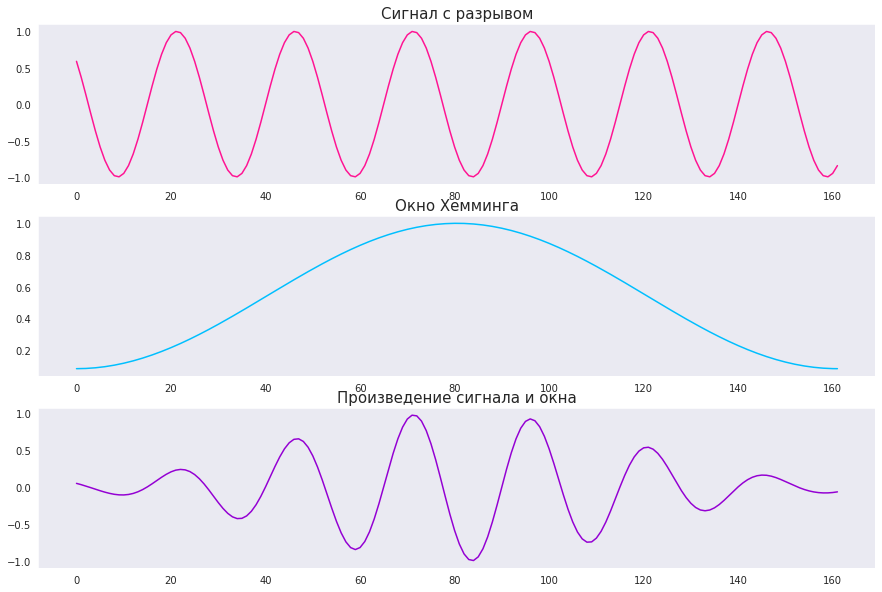

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("dark")

# Сигнал с разрывом  и окно Хемминга.
f = 8
sr = 200
periods = np.arange(sr) / sr
signal = np.sin((2*np.pi)*f*periods)
signal = signal[35:-3]
hamming_window = np.hamming(len(signal))
products = hamming_window * signal

# plot
fig, ax = plt.subplots(3, 1, figsize=(15, 10))
ax[0].plot(signal, c="deeppink")
ax[0].set_title("Сигнал с разрывом", fontsize=15)

ax[1].plot(hamming_window, "deepskyblue")
ax[1].set_title("Окно Хемминга", fontsize=15)

ax[2].plot(products, "darkviolet")
ax[2].set_title("Произведение сигнала и окна", fontsize=15)

Спектр сигнал с разрывом и сигнала умноженного на окно (Сглаженный)


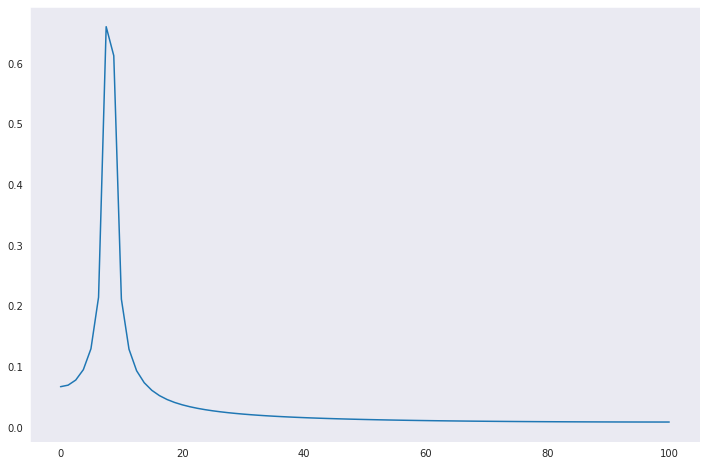

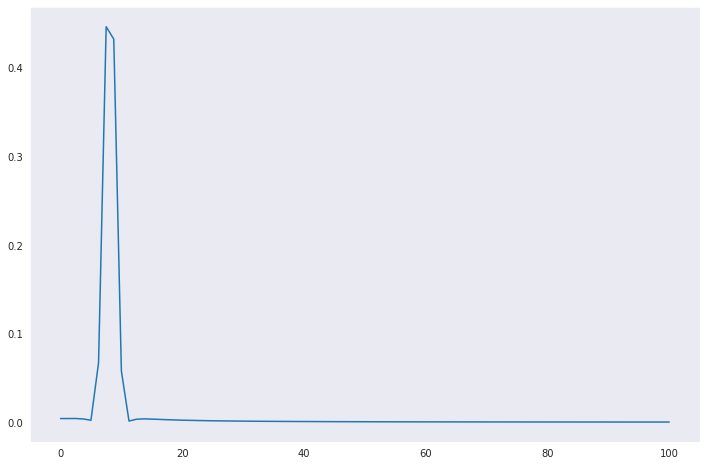

In [0]:
print("Спектр сигнал с разрывом и сигнала умноженного на окно (Сглаженный)")
fft_plot(signal, 200);
fft_plot(products, 200);

Как можно видеть, **спектр сигнала сглаженный окном - точне**, в то время как спектр сигнала с разрывом имеет широкую "распливчитость", эту "распливчитость"
называют **спектральная утечка**, поскольку энергия основной частоты сигнала  - утекает в другие частоты.

Таким образом **перед подачей окон в функцию преобразования Фурье - необходимо умножить каждое окно на оконную функцию**  Хемминга.

In [0]:
weighting = np.hanning(window_size)[:, None]
fft = np.fft.rfft(windows * weighting, axis=0)
fft = np.absolute(fft)

Чтобы получить мощность на каждой частоте выхода **fft** необходимо взять ее квадрат и нормализовать по количеству частотных выборок, так же как мы делали в функции **fft_plot**.

Затем  необходимо так же **масштабировать значения таким образом, чтобы максимальное значение составляло 1, а затем взять логарифм значений для преобразования в дБ**.


Мощность сигнала как функция частоты является общей метрикой, используемой при обработке сигналов. 

In [0]:
fft = fft**2
scale = np.sum(weighting**2) * sample_rate
fft[1:-1, :] *= (2.0 / scale)
fft[(0, -1), :] /= scale
    
freqs = float(sample_rate) / window_size * np.arange(fft.shape[0])

Наконец мы задаем максимальную мощность которую возможно встретить в сигнале по теореме **ВНКШ**, и берем  **логарифм частот до предельной мощности**.

In [0]:
max_freq = sample_rate // 2
eps = 1e-10 

ind = np.where(freqs <= max_freq)[0][-1] + 1
specgram = np.log(fft[:ind, :] + eps)
times = np.linspace(0, len(samples)/sample_rate, len(samples))

Запишем расмотренное выше в функцию

In [0]:
def spectrogram(samples, sample_rate, stride_ms = 10.0, 
                          window_ms = 20.0, max_freq = None, eps = 1e-10):

    stride_size = int(0.001 * sample_rate * stride_ms)
    window_size = int(0.001 * sample_rate * window_ms)

    # Extract strided windows
    truncate_size = (len(samples) - window_size) % stride_size
    samples = samples[:len(samples) - truncate_size]

    nshape = (window_size, (len(samples) - window_size) // stride_size + 1)
    nstrides = (samples.strides[0], samples.strides[0] * stride_size)
    
    windows = np.lib.stride_tricks.as_strided(samples, 
                                          shape = nshape, strides = nstrides)
    
    assert np.all(windows[:, 1] == samples[stride_size:(stride_size + window_size)])

    # Window weighting, squared Fast Fourier Transform (fft), scaling
    weighting = np.hanning(window_size)[:, None]
    
    fft = np.fft.rfft(windows * weighting, axis=0)
    fft = np.absolute(fft)
    fft = fft**2
    
    # https://dsp.stackexchange.com/questions/4691/what-is-the-difference-between-psd-and-squared-magnitude-of-frequency-spectrum?lq=1
    scale = np.sum(weighting**2) * sample_rate
    fft[1:-1, :] *= (2.0 / scale)
    fft[(0, -1), :] /= scale
    
    # Prepare fft frequency list
    freqs = float(sample_rate) / window_size * np.arange(fft.shape[0])
    
    # Compute spectrogram feature
    ind = np.where(freqs <= max_freq)[0][-1] + 1
    specgram = np.log(fft[:ind, :] + eps)
    times = np.linspace(0, len(samples)/sample_rate, len(samples))
    return specgram, freqs, times

Выходом функции будет  2d матрица она  же спектрограмма. В этой матрице строки и столбцы представляют номер кадра окна и частотный интервал, а значения представляют силу частот.

Вычислим и изобразим спектрограмму.

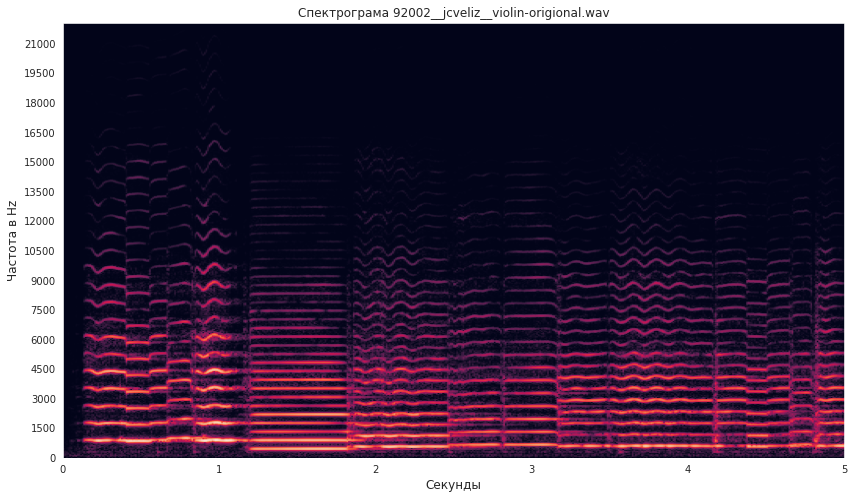

In [0]:
specgram, freqs, times = spectrogram(samples, sampling_rate, max_freq=22050)

fig, ax = plt.subplots(figsize=(14, 8))
plt.grid(False)

ax.imshow(specgram, aspect='auto', origin='lower', 
           extent=[np.float(times.min()), np.float(times.max()), np.float(freqs.min()), np.float(freqs.max())]);

ax.set_yticks(freqs[::30])
#ax.set_xticks((times[::10000])
ax.set_title('Спектрограма ' + filename)
ax.set_ylabel('Частота в Hz', fontsize=12)
ax.set_xlabel('Секунды', fontsize=12)
plt.savefig("specgram.png", bbox_inches='tight', pad_inches=0.2, transparent=True)

Цвет несет информацию об интенсивности той или иной частоты.

На практике для расчитывания спектограммы можно использовать **готовые высокоуровнивые функции**, ниже приведен код расчета спектограммы с помощью модуля **signal** библиотеки **scipy**.

In [0]:
from scipy import signal

def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

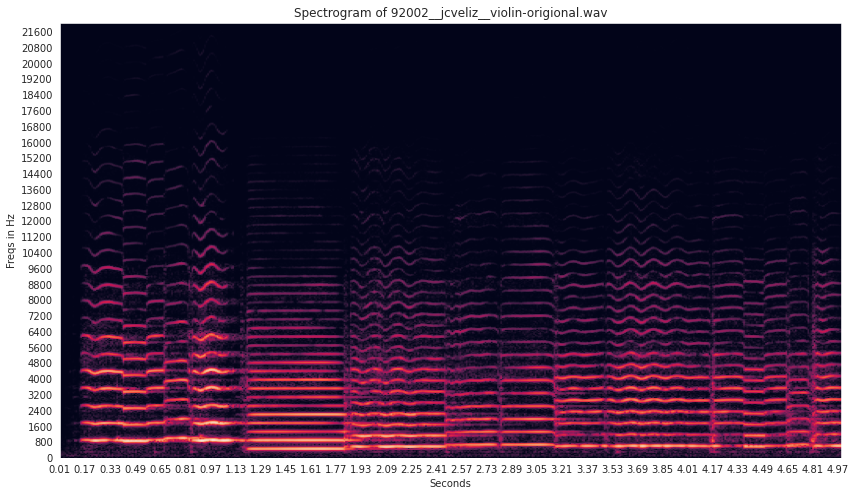

In [0]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig, ax2 = plt.subplots(figsize=(14, 8))
ax2.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

plt.savefig("specgram.png", bbox_inches='tight', pad_inches=0.2)

# Мел-Спектрограмма | Mel Spectrogram

Если которотко, то мел потому что [мел-шкала](https://en.wikipedia.org/wiki/Mel_scale) а спектограмма, да потому что та самая спектограма(п̲о̲ч̲т̲и̲) которая вверху, только не в децебельной шкале(логарифмической) а в [мел-шкале](https://en.wikipedia.org/wiki/Mel_scale).

Если вы человек, то ваш слух хорошо различает низкие и среднии частоты, а высокие не очень, например **разница между 100 Гц и 120 Гц будет заметна, а между 10000 и 10020 уже нет.**

Вообщем мел-спектрограммы придумали на основе человеческого восприятия звука.

Популярная **формула перевода из герц в мелс**:

![alt](https://wikimedia.org/api/rest_v1/media/math/render/svg/2e8a48e66fa73f33901e824ceb1ad6009007ffda)

Популярная потому что неоднозначная, в зависимости от задачи - коэффициент может варироваться.



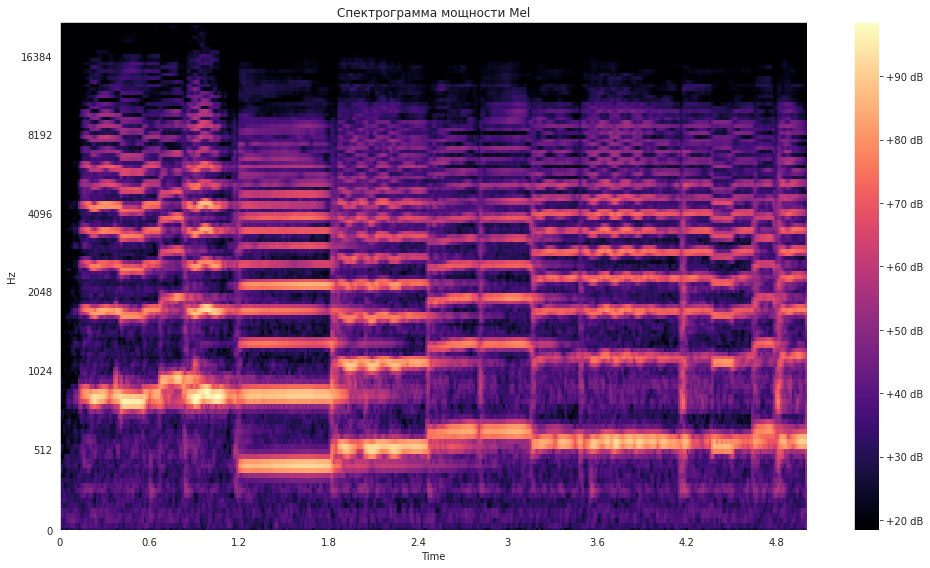

In [0]:
# From this tutorial
# https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.min, )

plt.figure(figsize=(14, 8))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel',  fmax=22050)
plt.title('Спектрограмма мощности Mel', fontsize=12)
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()
plt.savefig("melspecgram.png", bbox_inches='tight', pad_inches=0.2)

# Мел-кепстральные коэффициенты | MFCC

Мел-кепстральные коэффициенты | MFCC - это
та самая спектограма(п̲о̲ч̲т̲и̲) что и Мел-Спектрограмма, только **MFCC состоит не из оконных спектров а из кепстральных коэфициентов**(окон), таких же окон которые мы получали при расчете спектограммы разбивая исходный сигнал на части, затем применив к ним Фурье преобразование - получали **спектры**, такими действиями мы переводили маленькие сигналы(окна) из временной области, в частотную, в конце брали логарифм мощности(амплитуды)спектров для маштабирования в децебельную шкалу.

В случае **кепстров** они же **спектры спектров**, мы на этом не останавливаемся и применяем к посчитаным велечинам еще одно преобразование Фурье или [дискретно косинусное преобразование](https://www.youtube.com/watch?v=yI5yhsFrYGQ).
Смысл кепстра - показать как быстро меняються частоты.

Cамо слово **кепстр** котороее дивно похоже на **спектр**,
так называеться поскольку полученная величена вычисленная вышеописаным образом - находиться **ни во временной области ни в частотной**, значения псевдочастот в кепстре сигнала называються **quefrency** на манеру **frequency**.

Вот и получаеться что **Cepstrum это - спектр логарифма спектра временного сигнала**, и **Мел-кепстральные коэффициенты(MFCC) считаються не по спектрам окон, а по кепстрам окон.**


Схема расчета **MFCC**:
![alt](https://miro.medium.com/max/1400/1*BcERsxjyecXRSGKLdxzVaQ.jpeg)

Как видно после преобразования Фурье, **спектры умножаються на оконные функции (Filter Bank) которые переводят мощность(амлитуды)спектра на mel-шкалу, по этой причине кепстри называються mel-frequency кепстрами**


В случае расчета спектограммы, схема таже если отбросить Filter Bank и второе преобразование Фурье которое кстати может быть заменено дискретным косинусным преобразованием.

Можно остановиться после шага **Log**(фиолетовый цвет) и тогда у нас будет спектограмма маштабированая по **Filter banks** они же преобразованные окна, и мы будем видеть имитацию [**нелинейного восприятие звука человеческим ухом**](https://ru.wikipedia.org/wiki/%D0%9F%D1%81%D0%B8%D1%85%D0%BE%D0%B0%D0%BA%D1%83%D1%81%D1%82%D0%B8%D0%BA%D0%B0), коэффициенты банка фильтров aka mel-frequency кепстры - сильно коррелированы, с чем помогает бороться дискретное косинусное преобразование [**DCT**](https://ru.wikipedia.org/wiki/%D0%94%D0%B8%D1%81%D0%BA%D1%80%D0%B5%D1%82%D0%BD%D0%BE%D0%B5_%D0%BA%D0%BE%D1%81%D0%B8%D0%BD%D1%83%D1%81%D0%BD%D0%BE%D0%B5_%D0%BF%D1%80%D0%B5%D0%BE%D0%B1%D1%80%D0%B0%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5).

Подробней:
+ http://robotics.bstu.by/mwiki/images/c/ca/PopularCepstral.pdf
+ https://en.wikipedia.org/wiki/Mel-frequency_cepstrum
+ https://towardsdatascience.com/how-i-understood-what-features-to-consider-while-training-audio-files-eedfb6e900
+ https://towardsdatascience.com/how-i-understood-what-features-to-consider-while-training-audio-files-eedfb6e9002b
+ http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/

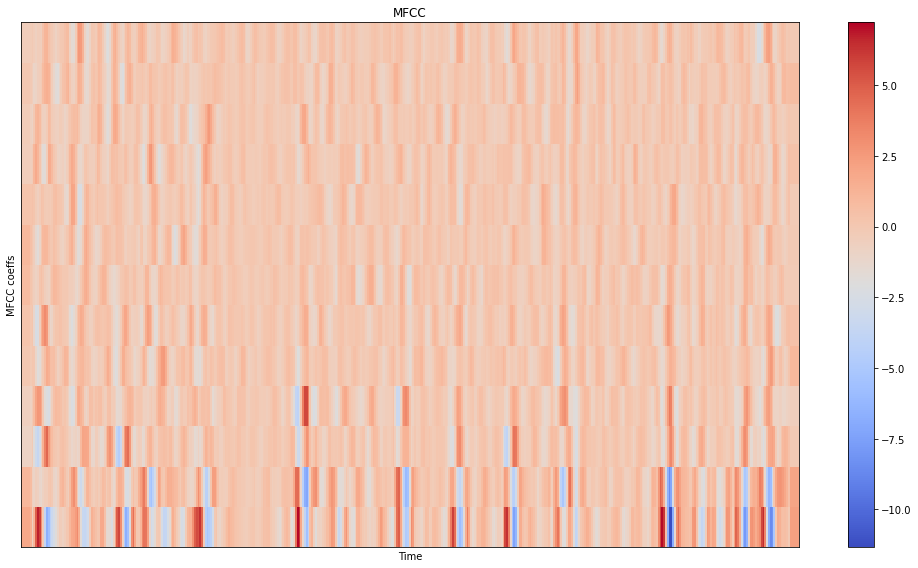

In [0]:
# Get spectrogram.
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.min, )

# Convert in mel scale.
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(14, 8))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

Дополнительная информация:
+ https://towardsdatascience.com/getting-to-know-the-mel-spectrogram-31bca3e2d9d0
+ https://haythamfayek.com/2016/04/21/speech-processing-for-machine-learning.html
+ https://en.wikipedia.org/wiki/Mel-frequency_cepstrum
+ https://habr.com/ru/post/140828/
+ https://habr.com/ru/post/462527/
+ https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
+ https://librosa.github.io/librosa/generated/librosa.display.specshow.html
+ https://librosa.github.io/librosa/generated/librosa.feature.melspectrogram.html
+ http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/
+ https://medium.com/prathena/the-dummys-guide-to-mfcc-aceab2450fd
+https://www.youtube.com/watch?v=lTo77Yscm6Y&list=PLA0M1Bcd0w8xcPNkaqqRzmh4FEWTB671A

Познакомившись со спектограммами, мы уже можем решать задачи распознавания и классификации речи/звуков, сведя задачу к распознаванию изображений.
Хотя классифицировать звуки по изображениям можно и по **waveform**  на практике обученая модель на на таких данных, плохо маштабируеться на новые данные, интуитивно из-за большой дисперсии в амплитуде(звуке), между изображениями с одинаковимы метками, и вообще waveform содержит мало информации по сравнению со спектограммой.

Современные системы распознавания/генерирования речи основаных на нейронных сетях - используют спектограммы, mel-спектограммы, а так же мел-кепстральные коэффициенты (mfcc) в качестве данных для обучения.


Особености MFCC в декореляции извлеченных признаковых описаний, из-за чего mfcc была крайне популярна в алгоритмах не основаных на nn, но с развитием nn mffc перестало быть дефолтным выбором, так как nn отлично справляеться с извлечением признаков из высоко коррелированных данных.

---

**В качестве практики будет полезно решить [competition](https://www.kaggle.com/c/tensorflow-speech-recognition-challenge) на kaggle** по распознавании речи на [датасете](https://www.kaggle.com/c/tensorflow-speech-recognition-challenge/data), решение такой задачи по сложности сравнимо с распознаванием изображений на [данных **mnist**](https://www.kaggle.com/c/digit-recognizer)





# Итог

Дойдя до сюда, мы ознакомились со следуйщими терминами:
+ **Периодический сигнал**
+ **Апериодический сигнал**
+ **Частота сигнала**
+ **Частота дискретизации**
+ **Амплитуда**
+ **Период** сигнала
+ **Период дискретизации**
+ **Дискретное Преобразование Фурье** | **Быстрое Преобразование Фурье**
+ **Спектр сигнала**
+ **Оконные функции**
+ **Спектрограмма**
+ **Мел-Спектрограмма**
+ **Кепстр сигнала**
+ **Мел-кепстральные коэффициенты** (**MFCC**)
---
Если какой то из этих терминов вызывает вопросы - имеет смысл вернуться в соответствующее место тетради и пересмотреть материал.
